## Introduction
This dataset is a collection of basic health biological signal data.
The goal is to determine the presence or absence of smoking through bio-signals.

In [114]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
import pandas as pd  
import numpy as np  
from collections import Counter 
import seaborn as sns 
import matplotlib.pyplot as plt  
import plotly.express as px 
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler 
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from prettytable import PrettyTable
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")



## Reading the dataset

In [4]:
df = pd.read_csv('smoking.csv')
df.head(n = 10)

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0
5,5,M,30,180,75,85.0,1.2,1.2,1.0,1.0,...,16.2,1.0,1.2,18.0,27.0,33.0,Y,0,Y,0
6,6,M,40,160,60,85.5,1.0,1.0,1.0,1.0,...,17.0,1.0,0.7,21.0,27.0,39.0,Y,1,Y,1
7,7,M,45,165,90,96.0,1.2,1.0,1.0,1.0,...,15.0,1.0,1.3,38.0,71.0,111.0,Y,0,Y,0
8,9,F,50,150,60,85.0,0.7,0.8,1.0,1.0,...,13.7,1.0,0.8,31.0,31.0,14.0,Y,0,N,0
9,10,M,45,175,75,89.0,1.0,1.0,1.0,1.0,...,16.0,1.0,0.8,26.0,24.0,63.0,Y,0,N,0


In [5]:
# Drop ID
df = df.drop("ID", axis = 1)

In [6]:
df.columns

Index(['gender', 'age', 'height(cm)', 'weight(kg)', 'waist(cm)',
       'eyesight(left)', 'eyesight(right)', 'hearing(left)', 'hearing(right)',
       'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol',
       'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein',
       'serum creatinine', 'AST', 'ALT', 'Gtp', 'oral', 'dental caries',
       'tartar', 'smoking'],
      dtype='object')

####
#### We see thet the dataset attributes are divided into dependent and independent attributes.
#### The inedependent attributes are :
- `ID` : index
- `Gender`: The gender of the individual.
- `Age`: Age of the individual categorized into 5-year gaps.
- `Height`: Height of the individual in centimeters.
- `Weight`: Weight of the individual in kilograms.
- `Waist circumference`: Measurement of the individual's waist circumference in centimeters.
- `Eyesight (left)`: Assessment of the individual's eyesight in the left eye.
- `Eyesight (right)`: Assessment of the individual's eyesight in the right eye.
- `Hearing (left)`: Assessment of the individual's hearing ability in the left ear.
- `Hearing (right)`: Assessment of the individual's hearing ability in the right ear.
- `Systolic Blood Pressure`: Measurement of the pressure in the arteries when the heart beats.
- `Diastolic Blood Pressure`: Measurement of the pressure in the arteries when the heart is at rest.
- `Fasting Blood Sugar`: Measurement of blood sugar level after an overnight fast.
- `Cholesterol (total)`: Total cholesterol level in the blood.
- `Triglyceride`: Measurement of the level of triglycerides in the blood.
- `HDL Cholesterol`: Measurement of high-density lipoprotein (HDL) cholesterol level.
- `LDL Cholesterol`: Measurement of low-density lipoprotein (LDL) cholesterol level.
- `Hemoglobin`: Measurement of the amount of hemoglobin in the blood.
- `Urine Protein`: Presence of protein in the urine.
- `Serum Creatinine`: Measurement of the creatinine level in the blood.
- `AST` (glutamic oxaloacetic transaminase): Measurement of liver enzyme AST level.
- `ALT` (glutamic oxaloacetic transaminase): Measurement of liver enzyme ALT level.
- `GTP`: an energy-rich nucleotide analogous to ATP.
- `Oral Examination Status`: Status of oral examination.
- `Dental Caries`: Presence or absence of dental caries (cavities).
- `Tartar Status`: Status of tartar (hardened plaque) accumulation on teeth.<br>
#### The dependent attribute or (The target variable) is :
- `smoking`: NO smoking = N, YES smoking = Y

# Data Cleaning

In [9]:
# cheaking the null
df.isnull().sum()

gender                 0
age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
oral                   0
dental caries          0
tartar                 0
smoking                0
dtype: int64

In [10]:
df.shape

(55692, 26)

In [11]:
df.duplicated().sum()

11140

In [12]:
# droping the redundant data
df=df.drop_duplicates()

In [13]:
df.shape

(44552, 26)

### we see that there is no nulls in our dataset & we have removed the redundant data from our dataset

### Cheacking and Removing the Outliers

In [16]:
df.head(10)

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0
5,M,30,180,75,85.0,1.2,1.2,1.0,1.0,128.0,...,16.2,1.0,1.2,18.0,27.0,33.0,Y,0,Y,0
6,M,40,160,60,85.5,1.0,1.0,1.0,1.0,116.0,...,17.0,1.0,0.7,21.0,27.0,39.0,Y,1,Y,1
7,M,45,165,90,96.0,1.2,1.0,1.0,1.0,153.0,...,15.0,1.0,1.3,38.0,71.0,111.0,Y,0,Y,0
8,F,50,150,60,85.0,0.7,0.8,1.0,1.0,115.0,...,13.7,1.0,0.8,31.0,31.0,14.0,Y,0,N,0
9,M,45,175,75,89.0,1.0,1.0,1.0,1.0,113.0,...,16.0,1.0,0.8,26.0,24.0,63.0,Y,0,N,0


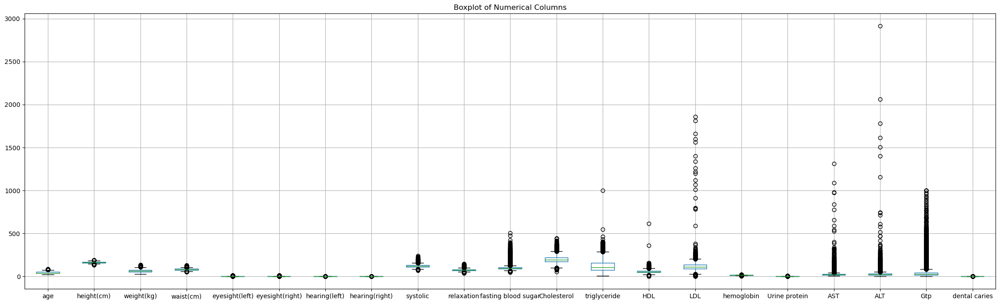

In [17]:
# Specify the columns to plot
numeric_cols = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'AST', 'ALT', 'Gtp', 'dental caries']

# Create a figure and axis object
fig, ax = plt.subplots(figsize=(28,8))

# Create the boxplot
df[numeric_cols].boxplot(ax=ax)

# Set the plot title
ax.set_title('Boxplot of Numerical Columns')

# Show the plot
plt.show()

#### Plotting each column

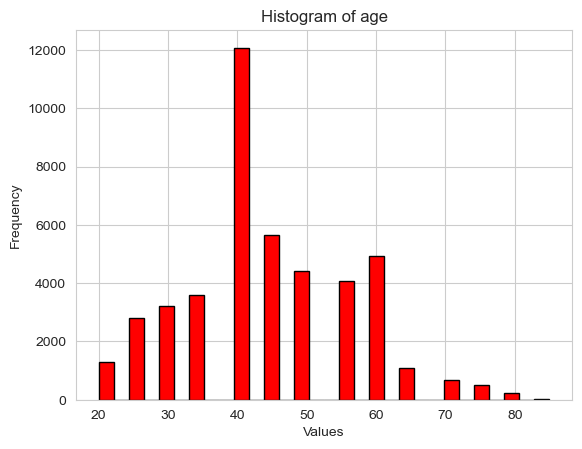

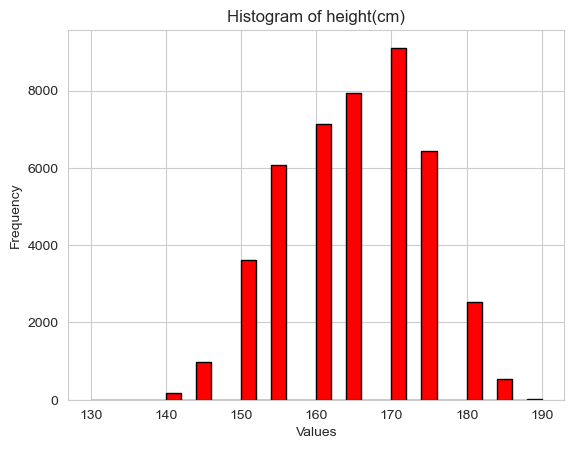

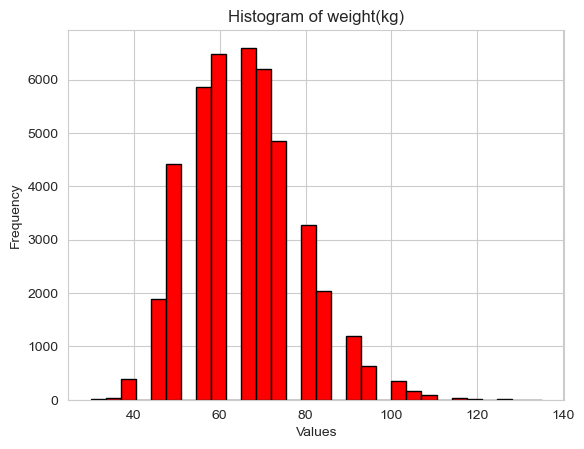

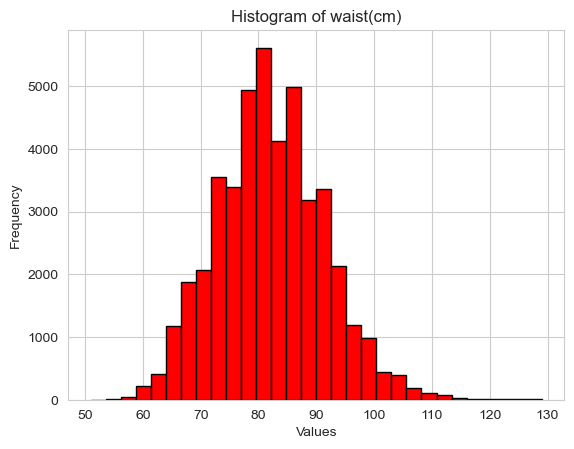

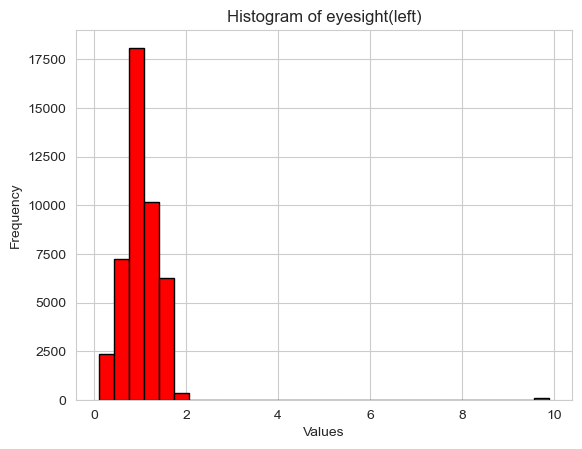

...

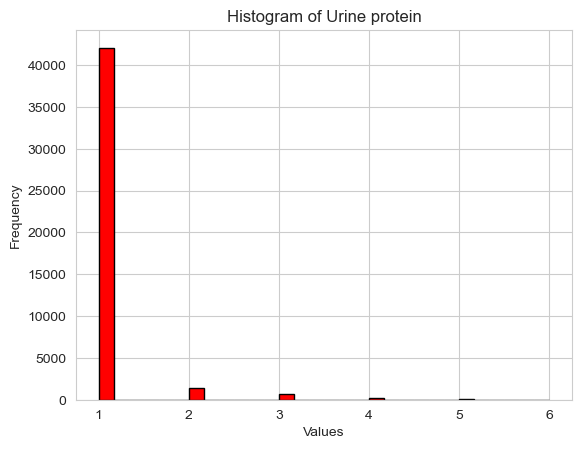

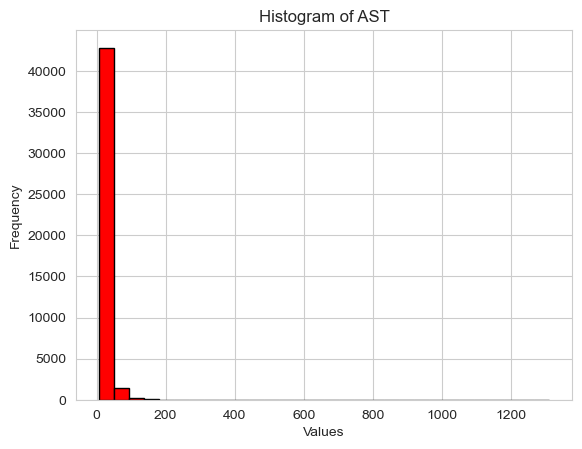

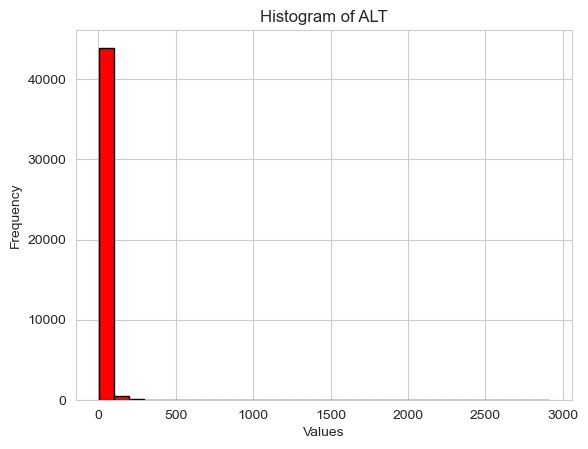

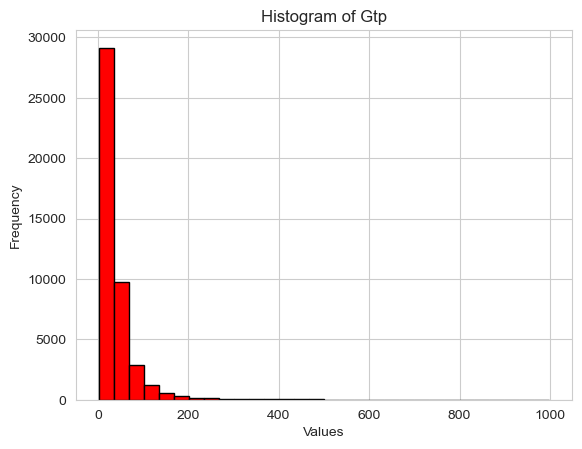

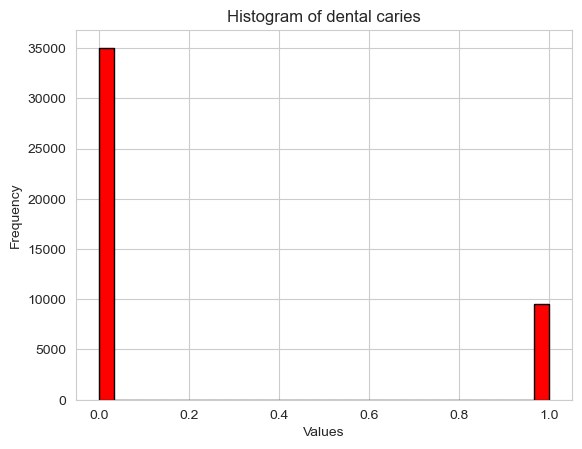

In [19]:
for column_name in numeric_cols:
    sns.set_style("whitegrid")
    plt.hist(df[column_name], bins=30, edgecolor='black', color='Red')
    plt.xlabel("Values")
    plt.ylabel("Frequency")
    plt.title("Histogram of " + column_name)
    plt.show()


##### Here we use IQR to detect the outliers and be able to remove them

In [21]:
numeric_cols = df.select_dtypes(include=['float', 'int']).columns

In [23]:
def detect_outliers(df, min_outlier_occurrences, columns):
    outlier_rows = []
    for col in columns:
        q1 = np.nanpercentile(df[col], 25)
        q3 = np.nanpercentile(df[col], 75)
        iqr = q3 - q1
        outlier_point = 1.5 * iqr
        outliers = df[(df[col] < q1 - outlier_point) | (df[col] > q3 + outlier_point)].index
        outlier_rows.extend(outliers)

    outlier_counts = Counter(outlier_rows)
    outlier_rows_to_drop = [row for row, count in outlier_counts.items() if count >= min_outlier_occurrences]

    return outlier_rows_to_drop


outlier_rows = detect_outliers(df, 5, df.select_dtypes(["float", "int"]).columns)
df = df.drop(outlier_rows)

In [25]:
df.isnull().sum()

gender                 0
age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
oral                   0
dental caries          0
tartar                 0
smoking                0
dtype: int64

In [27]:
df.shape

(44084, 26)

#### As we can see, we removed the outliers ..

# Data Exploration and Visualization

In [33]:
df.describe()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
count,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,...,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000,44084.000000
mean,44.178273,164.641026,65.759573,81.962905,1.012676,1.008518,1.023818,1.024295,121.365189,75.934262,...,57.318914,114.960916,14.614207,1.081458,0.885525,25.794370,26.469966,38.736934,0.210507,0.365484
std,12.056772,9.189835,12.681717,9.178336,0.486917,0.481965,0.152484,0.153964,13.499198,9.577142,...,14.748826,40.125841,1.559347,0.388878,0.225551,17.217872,28.486264,46.216111,0.407674,0.481571
min,20.000000,130.000000,30.000000,51.000000,0.100000,0.100000,1.000000,1.000000,71.000000,40.000000,...,4.000000,1.000000,4.900000,1.000000,0.100000,6.000000,1.000000,1.000000,0.000000,0.000000
25%,40.000000,160.000000,55.000000,76.000000,0.800000,0.800000,1.000000,1.000000,112.000000,70.000000,...,47.000000,92.000000,13.600000,1.000000,0.800000,19.000000,15.000000,17.000000,0.000000,0.000000
50%,40.000000,165.000000,65.000000,82.000000,1.000000,1.000000,1.000000,1.000000,120.000000,76.000000,...,55.000000,113.000000,14.800000,1.000000,0.900000,23.000000,21.000000,25.000000,0.000000,0.000000
75%,55.000000,170.000000,75.000000,88.000000,1.200000,1.200000,1.000000,1.000000,130.000000,82.000000,...,66.000000,136.000000,15.700000,1.000000,1.000000,28.000000,30.000000,43.000000,0.000000,1.000000
max,85.000000,190.000000,135.000000,129.000000,9.900000,9.900000,2.000000,2.000000,240.000000,140.000000,...,618.000000,1860.000000,20.900000,6.000000,11.600000,1090.000000,2914.000000,999.000000,1.000000,1.000000


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44084 entries, 0 to 44552
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   gender               44084 non-null  object 
 1   age                  44084 non-null  int64  
 2   height(cm)           44084 non-null  int64  
 3   weight(kg)           44084 non-null  int64  
 4   waist(cm)            44084 non-null  float64
 5   eyesight(left)       44084 non-null  float64
 6   eyesight(right)      44084 non-null  float64
 7   hearing(left)        44084 non-null  float64
 8   hearing(right)       44084 non-null  float64
 9   systolic             44084 non-null  float64
 10  relaxation           44084 non-null  float64
 11  fasting blood sugar  44084 non-null  float64
 12  Cholesterol          44084 non-null  float64
 13  triglyceride         44084 non-null  float64
 14  HDL                  44084 non-null  float64
 15  LDL                  44084 non-null  floa

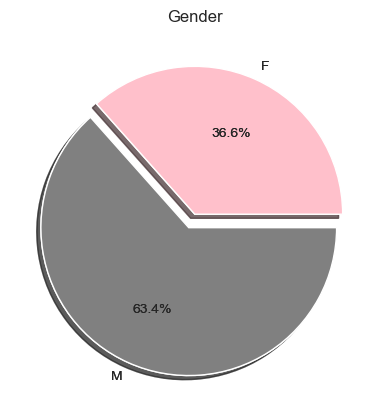

In [39]:
df.groupby('gender').size().plot(kind='pie', explode=[0,0.1], autopct='%1.1f%%', shadow=True, colors=["pink", "gray"], title="Gender")
plt.show()

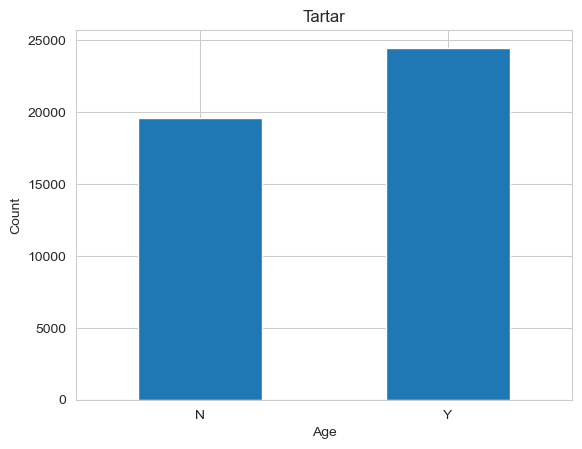

In [41]:
df.groupby('tartar').size().plot(kind='bar', title="Tartar", rot=0, xlabel='Age', ylabel='Count')
plt.show()

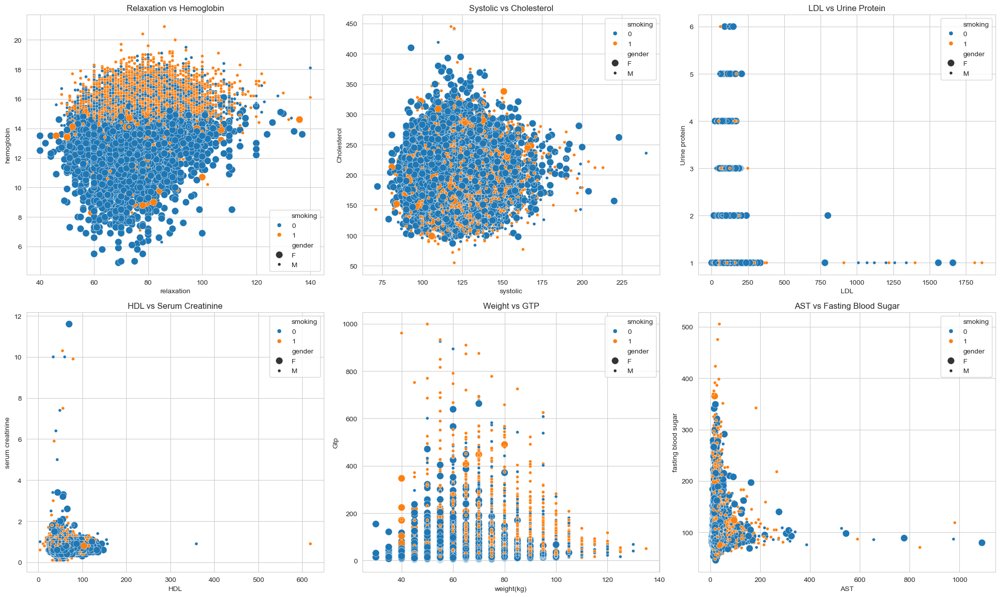

In [43]:
plot_params = [
    ("relaxation", "hemoglobin", "Relaxation vs Hemoglobin"),
    ("systolic", "Cholesterol", "Systolic vs Cholesterol"),
    ("LDL", "Urine protein", "LDL vs Urine Protein"),
    ("HDL", "serum creatinine", "HDL vs Serum Creatinine"),
    ("weight(kg)", "Gtp", "Weight vs GTP"),
    ("AST", "fasting blood sugar", "AST vs Fasting Blood Sugar")
]
# Create subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

# Plot using loop
for i, (x, y, title) in enumerate(plot_params):
    sns.scatterplot(
        ax=axes[i],
        x=x,
        y=y,
        hue="smoking",
        size="gender",
        sizes=(20, 100),
        legend="full",
        data=df
    ).set(title=title)

plt.tight_layout()
plt.show()


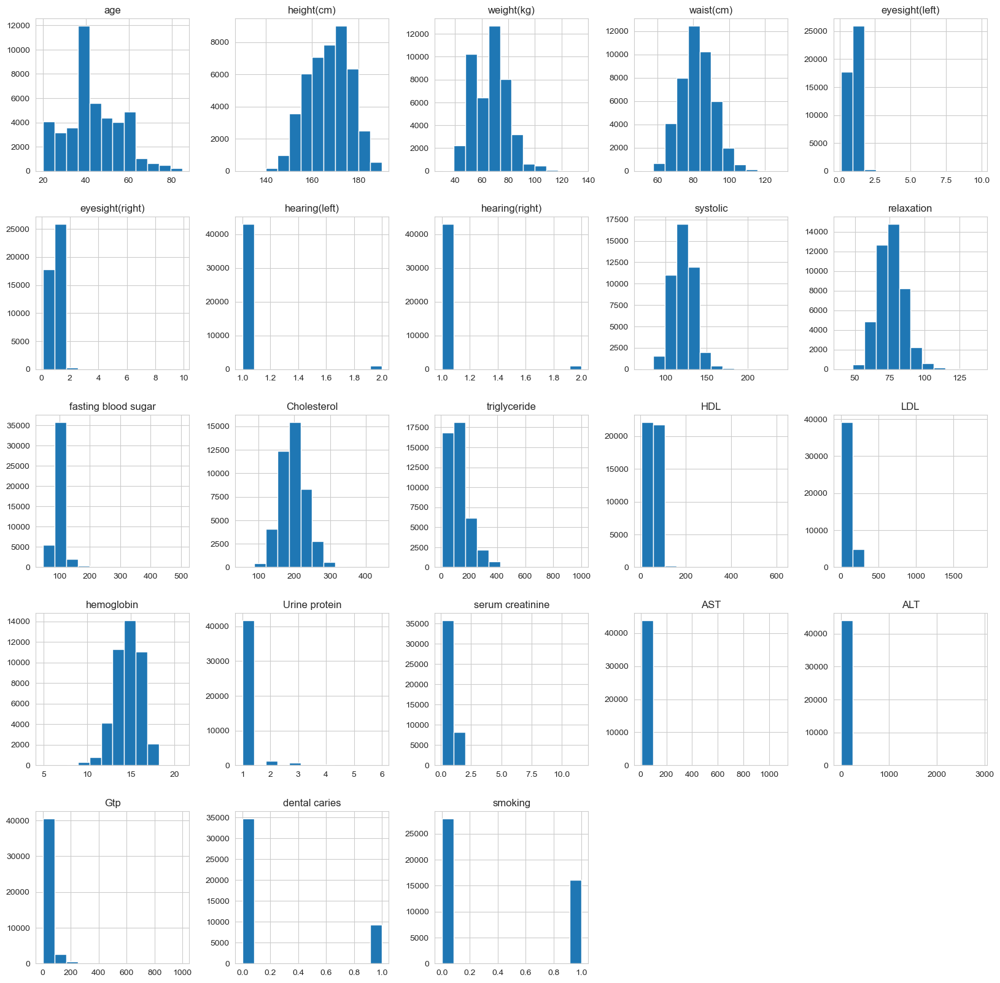

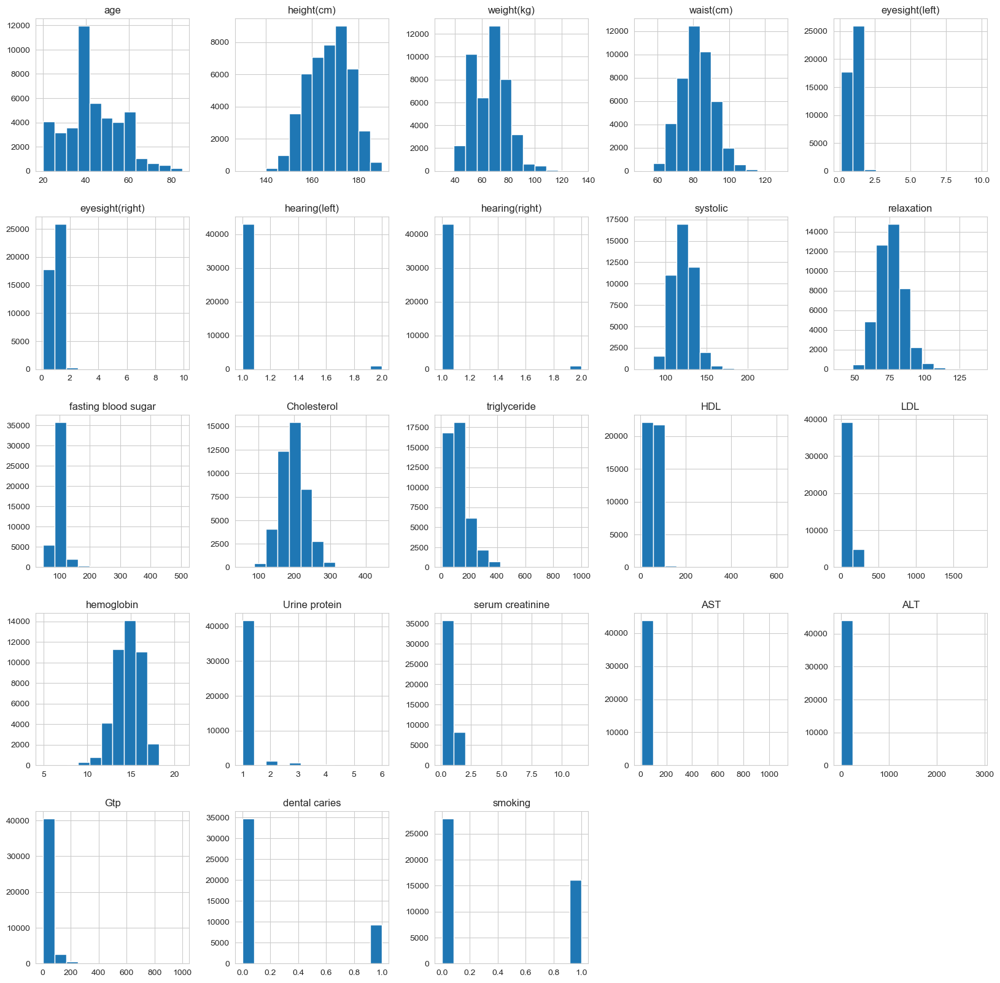

In [47]:
df.hist(figsize =(20, 20), bins =12 ,legend =False)
plt.show()

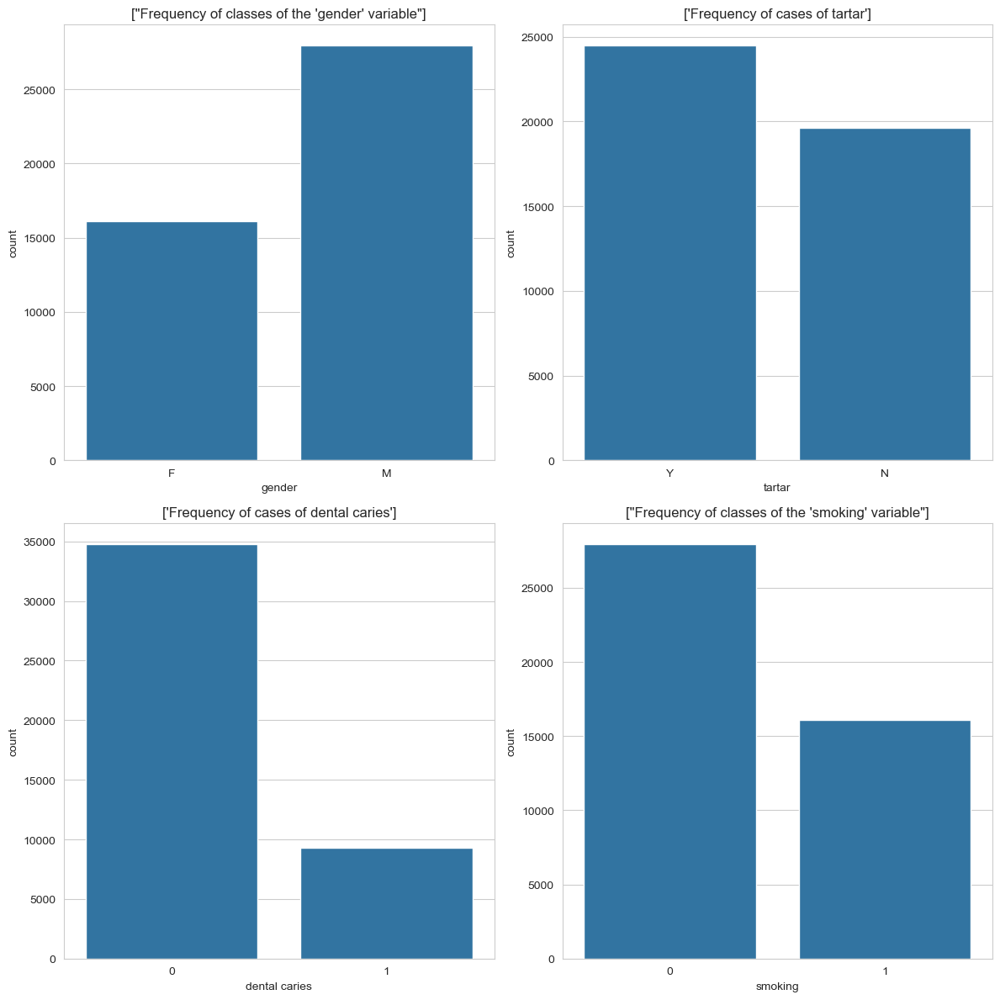

In [59]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

sns.countplot(ax=axes[0], x="gender", data=df).set(title=["Frequency of classes of the 'gender' variable"])
sns.countplot(ax=axes[1], x="tartar", data=df).set(title=["Frequency of cases of tartar"])
sns.countplot(ax=axes[2], x="dental caries", data=df).set(title=["Frequency of cases of dental caries"])
sns.countplot(ax=axes[3], x="smoking", data=df).set(title=["Frequency of classes of the 'smoking' variable"])

plt.tight_layout()
plt.show()

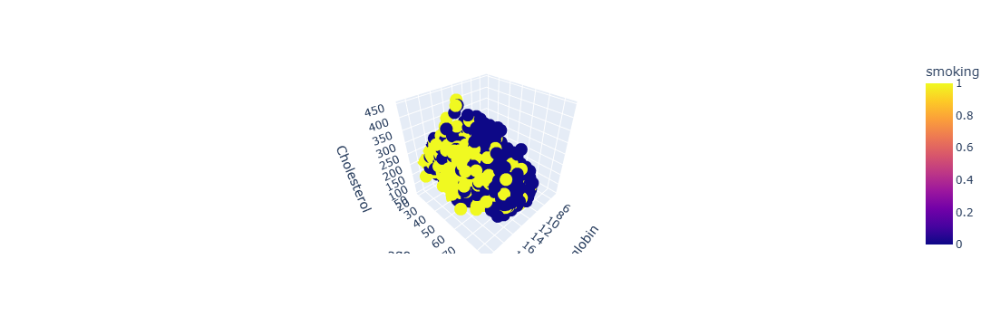

In [64]:
fig = px.scatter_3d(df, 
                    x = "hemoglobin",
                    y = "age",
                    z = "Cholesterol",
                    color="smoking")
fig.show()

### Observations based on the last explorations:<br>
1. The % of smokers within each blood pressure group is the highest among those who have hypertensive crisis and the least among those with normal blood pressure
2. Maximum people in the dataset have normal blood pressure
3. The highest number of nonsmokers is in the normal blood pressure
    Information source: https://www.heart.org/en/health-topics/high-blood-pressure/understanding-blood-pressure-readings
4. HDL (the good cholesterol) is higher for non-smokers.
5. Average LDL (the bad cholesterol) is higher for smokers.
6. AST and ALT are healthy for both smoker and non-smoker groups. GTP is at risk for smokers.

# Data Preprocessing

## Encoding and Splitting the data

In [70]:
lbe = LabelEncoder()
lbe.fit_transform(df["gender"])
df["gender"] = lbe.fit_transform(df["gender"])
lbe.fit_transform(df["tartar"])
df["tartar"] = lbe.fit_transform(df["tartar"])
lbe.fit_transform(df["oral"])
df["oral"] = lbe.fit_transform(df["oral"])
lbe.fit_transform(df["smoking"])
df["smoking"] = lbe.fit_transform(df["smoking"])

In [72]:
df.head()

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,...,12.9,1.0,0.7,18.0,19.0,27.0,0,0,1,0
1,0,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,...,12.7,1.0,0.6,22.0,19.0,18.0,0,0,1,0
2,1,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,...,15.8,1.0,1.0,21.0,16.0,22.0,0,0,0,1
3,1,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,...,14.7,1.0,1.0,19.0,26.0,18.0,0,0,1,0
4,0,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,...,12.5,1.0,0.6,16.0,14.0,22.0,0,0,0,0


In [74]:
# select dependent variable (label)
y = df["smoking"]

# select independent variable (estimator)
x = df.drop("smoking", axis = 1)

In [76]:
# Train-Test-Split   
x_train, x_test, y_train, y_test  = train_test_split(x, y, test_size=0.2, shuffle = True, random_state=1)

## Scaling the data

In [79]:
scaler = StandardScaler()
scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

# Classification Models

## Logistic Regression

In [129]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Step 1: Initialize the model
model = LogisticRegression(random_state=42, max_iter=1000)

# Step 2: Train (fit) the model on training data
model.fit(x_train, y_train)

# Step 3: Predict on test data
y_pred = model.predict(x_test)

# Step 4: Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7471929227628445

Confusion Matrix:
 [[4376 1178]
 [1051 2212]]

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.79      0.80      5554
           1       0.65      0.68      0.66      3263

    accuracy                           0.75      8817
   macro avg       0.73      0.73      0.73      8817
weighted avg       0.75      0.75      0.75      8817



## Decision Tree

In [132]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Step 1: Initialize the model
dt_model = DecisionTreeClassifier(random_state=42)

# Step 2: Train the model
dt_model.fit(x_train, y_train)

# Step 3: Predict on test data
y_pred_dt = dt_model.predict(x_test)

# Step 4: Evaluate the model
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_dt))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))


Decision Tree Accuracy: 0.6873086083701939

Confusion Matrix:
 [[4172 1382]
 [1375 1888]]

Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.75      0.75      5554
           1       0.58      0.58      0.58      3263

    accuracy                           0.69      8817
   macro avg       0.66      0.66      0.66      8817
weighted avg       0.69      0.69      0.69      8817



## Support Vector Machine (SVM) Model 

In [83]:
svm = SVC(kernel='rbf')
# fit the model with data
svm.fit(x_train, y_train)
# predict with test dataset
y_predict_SVM = svm.predict(x_test)
print(classification_report(y_test,y_predict_SVM))
accuracy_Score_SVM = metrics.accuracy_score(y_test, y_predict_SVM)
print('SVM model accuracy is: {:.2f}%'.format(accuracy_Score_SVM*100))

              precision    recall  f1-score   support

           0       0.82      0.80      0.81      5554
           1       0.67      0.70      0.68      3263

    accuracy                           0.76      8817
   macro avg       0.74      0.75      0.74      8817
weighted avg       0.76      0.76      0.76      8817

SVM model accuracy is: 75.83%


### Confusion Matrix for SVM

Confusion Matrix for SVM :
 [[4416 1138]
 [ 993 2270]] 



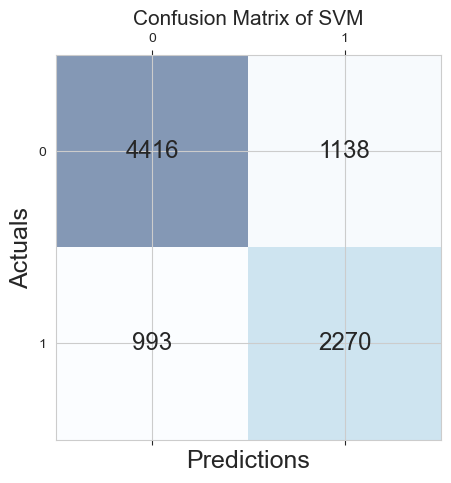

In [85]:
cm = metrics.confusion_matrix(y_test, y_predict_SVM)
print('Confusion Matrix for SVM :\n', cm, '\n')
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.5)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(x=j, y=i,s=cm[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix of SVM', fontsize=15)
plt.show()

## Random Forest Classifier  Model 

In [88]:
models = RandomForestClassifier(n_estimators=500)
models.fit(x_train, y_train)
# predict with test dataset
y_predict_random = models.predict(x_test)
print(classification_report(y_test,y_predict_random))
accuracy_Score_random = metrics.accuracy_score(y_test, y_predict_random)
print('RandomForest model accuracy is: {:.2f}%'.format(accuracy_Score_random*100))

              precision    recall  f1-score   support

           0       0.82      0.80      0.81      5554
           1       0.67      0.70      0.69      3263

    accuracy                           0.76      8817
   macro avg       0.75      0.75      0.75      8817
weighted avg       0.76      0.76      0.76      8817

RandomForest model accuracy is: 76.19%


### Confusion Matrix for Random Forest Classifier

Confusion Matrix for Random Forest Classifier :
 [[4433 1121]
 [ 978 2285]] 



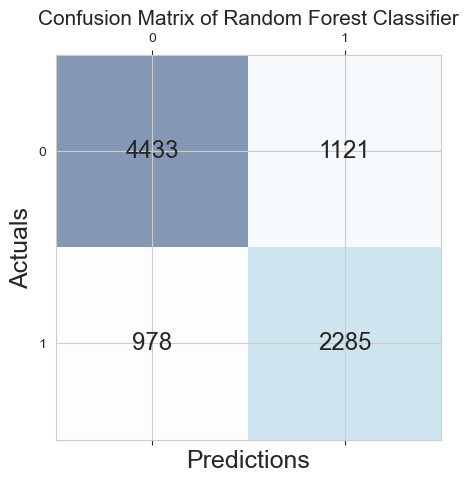

In [89]:
cm = metrics.confusion_matrix(y_test, y_predict_random)
print('Confusion Matrix for Random Forest Classifier :\n', cm, '\n')
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.5)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(x=j, y=i,s=cm[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix of Random Forest Classifier', fontsize=15)
plt.show()

### XGBoost model

#### Why I used this model to this data ?<br>
1. `High-performance`: XGBoost is known for delivering accurate predictions and has a strong track record in machine learning competitions and real-world applications.

2. `Handling complex relationships`: XGBoost is effective at capturing intricate patterns and relationships between different features in the dataset.

3. `Feature importance`: XGBoost can identify the most important factors in making predictions, helping us understand the key signals related to smoking behavior.

4. `Handling imbalanced data`: XGBoost has techniques to handle imbalanced datasets, where the number of samples in different classes is skewed, improving its performance in classifying smoking behavior.

5. `Flexibility and customization`: XGBoost provides a wide range of settings that can be adjusted to optimize model performance for the specific dataset, allowing us to fine-tune the model accordingly.

6. `Ensemble learning`: XGBoost utilizes an ensemble of decision trees, combining their predictions to make a final decision. This ensemble approach helps to reduce overfitting and improve generalization performance.

In [96]:
xgb_model = XGBClassifier(n_estimators = 600)
xgb_model.fit(x_train, y_train)
pred_xgb = xgb_model.predict(x_test)
print(classification_report(y_test,pred_xgb))
accuracy_Score_xgb = metrics.accuracy_score(y_test, pred_xgb)
print('XGBoosting model accuracy is: {:.2f}%'.format(accuracy_Score_xgb*100))

              precision    recall  f1-score   support

           0       0.79      0.80      0.80      5554
           1       0.66      0.64      0.65      3263

    accuracy                           0.74      8817
   macro avg       0.72      0.72      0.72      8817
weighted avg       0.74      0.74      0.74      8817

XGBoosting model accuracy is: 74.35%


## Confusion Matrix for XGBoost model

Confusion Matrix for XGBoosting Classifier :
 [[4456 1098]
 [1164 2099]] 



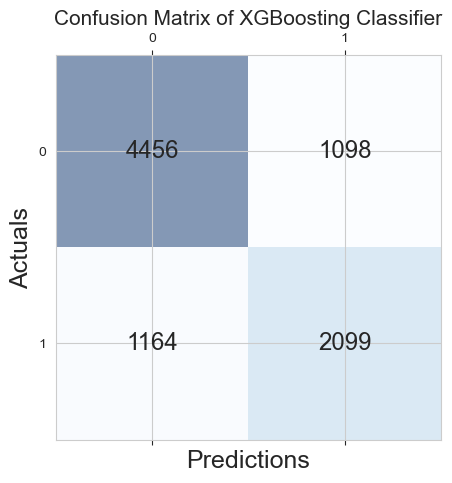

In [99]:
cm = metrics.confusion_matrix(y_test, pred_xgb)
print('Confusion Matrix for XGBoosting Classifier :\n', cm, '\n')
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(cm, cmap=plt.cm.Blues, alpha=0.5)
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(x=j, y=i,s=cm[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix of XGBoosting Classifier', fontsize=15)
plt.show()

### ROC Curve

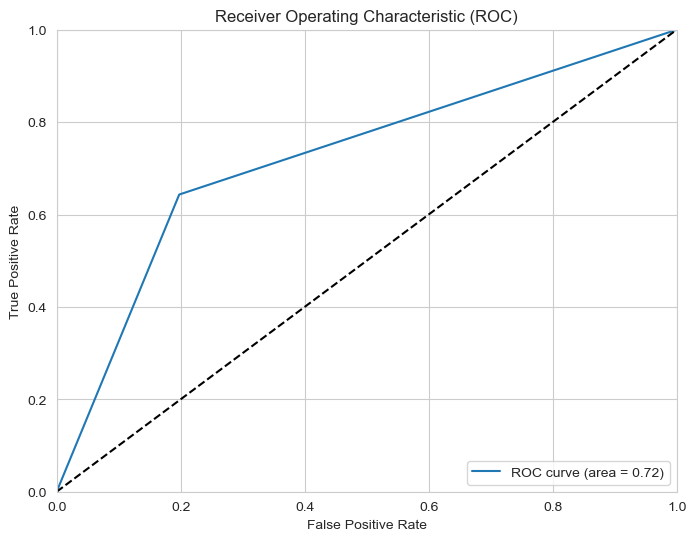

In [102]:
from sklearn.metrics import roc_curve, roc_auc_score
fpr, tpr, thresholds = roc_curve(y_test, pred_xgb)
auc = roc_auc_score(y_test, pred_xgb)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


### Feature Importance

gender: 0.7654139995574951
dental caries: 0.015910226851701736
age: 0.014682786539196968
Gtp: 0.014604844152927399
tartar: 0.013816277496516705
hearing(right): 0.011419878341257572
serum creatinine: 0.01081661693751812
Urine protein: 0.010239746421575546
triglyceride: 0.010000566951930523
ALT: 0.009948305785655975
height(cm): 0.009817389771342278
weight(kg): 0.009631941094994545
hemoglobin: 0.00954386219382286
LDL: 0.009482073597609997
waist(cm): 0.009206367656588554
AST: 0.009105001576244831
HDL: 0.009099720045924187
systolic: 0.009030166082084179
fasting blood sugar: 0.008909855037927628
Cholesterol: 0.008623886853456497
eyesight(left): 0.008615872822701931
relaxation: 0.008462068624794483
eyesight(right): 0.008456396870315075
hearing(left): 0.005162142217159271
oral: 0.0


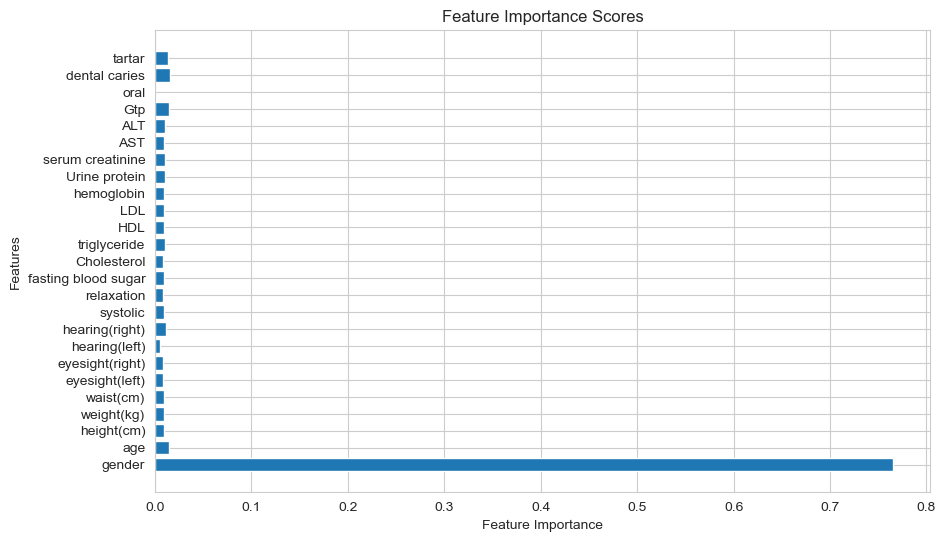

In [105]:
# Get the feature importance scores
importance_scores = xgb_model.feature_importances_

# Get the names of the features
feature_names = x.columns

# Create a dictionary with feature names as keys and importance scores as values
feature_importance = dict(zip(feature_names, importance_scores))

# Sort the features based on their importance scores
sorted_features = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)

# Print the feature importance in descending order
for feature, importance in sorted_features:
    print(f"{feature}: {importance}")

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.barh(range(len(importance_scores)), importance_scores, align='center')
plt.yticks(range(len(feature_names)), feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance Scores')
plt.show()

In [117]:
x = PrettyTable()
print('\n')
print("Comparison of Models Results")
x.field_names = ["Model", "Accuracy"]

x.add_row(["Random Forest", round(accuracy_score(y_test, models.predict(x_test)), 3)])
x.add_row(["SVM", round(accuracy_score(y_test, svm.predict(x_test)), 3)])
x.add_row(["XGBoost", round(accuracy_score(y_test, xgb_model.predict(x_test)), 2)])

print(x)
print('\n')



Comparison of Models Results
+---------------+----------+
|     Model     | Accuracy |
+---------------+----------+
| Random Forest |  0.762   |
|      SVM      |  0.758   |
|    XGBoost    |   0.74   |
+---------------+----------+


